<a href="https://colab.research.google.com/github/MohannadEhabBarakat/AI-ML-training/blob/master/Copy_of_Copy_of_AE_workflow.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
#imports
import os 
import zipfile 
import shutil 
import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Model 
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras import regularizers

import cv2

from google.colab import drive

In [3]:
#Extract
def load_gray_dataset():
  if os.path.isfile("/content/cookies.txt"):
    !wget -x --load-cookies cookies.txt "https://www.kaggle.com/arnaud58/landscape-pictures/download" -O /tmp/data.zip
  else:
    raise Exception("cookies.txt was not found")

  local_zip = '/tmp/data.zip' 
  zip_ref = zipfile.ZipFile(local_zip, 'r') 
  zip_ref.extractall('/tmp/data/source') 
  zip_ref.close()

  return "/tmp/data/source"

def load_nir_dataset(train_nir=None, train_rgb=None, val=None):
  drive.mount('/content/drive')

  # default values
  if not train_nir:
    train_nir = "NIR"
  if not train_rgb:
    train_rgb = "RGB-Registered"
  if not val:
    val = "Validation"

  train_nir = os.path.join("/content/drive/My Drive", train_nir)
  train_rgb = os.path.join("/content/drive/My Drive", train_rgb)
  val = os.path.join("/content/drive/My Drive", val)
  return train_nir, train_rgb, val

def load_dataset(isNIR=False, train_nir=None, train_rgb=None, val=None):
  if isNIR:
    return load_nir_dataset(train_nir=train_nir, train_rgb=train_rgb, val=val)
  return load_gray_dataset()

# load_dataset(isNIR=False)

In [4]:
def creat_if_not_exist(dir):
      if not os.path.isdir(dir):
        os.mkdir(dir)

def split_data(SOURCE=None, TRAINING=None, TESTING=None, SPLIT_SIZE=None):
  if not SPLIT_SIZE:
    SPLIT_SIZE = 0.8
  if not SOURCE:
    SOURCE = "/tmp/data/source"
  if not TRAINING:
    TRAINING = os.path.join(SOURCE, "..", "train")
  if not TESTING:
    TESTING = os.path.join(SOURCE, "..","test")

  if os.path.isdir(TRAINING):
    shutil.rmtree(TRAINING)

  if os.path.isdir(TESTING):
    shutil.rmtree(TESTING)

  creat_if_not_exist(TRAINING)
  creat_if_not_exist(TESTING)

  source = os.listdir(SOURCE)
  len_of_source= len(source)
  print ("Source data: ", len(source))
  split_point = int(SPLIT_SIZE * len(source))
  print ("Train split size: ", split_point)
  rng = np.random.default_rng()
  choice = rng.choice(len(source), size=split_point, replace=False)

  for f in choice:
    current = source[f]
    s = os.path.join(SOURCE, current)
    d = os.path.join(TRAINING, current)
    if os.path.isfile(s):
      shutil.copyfile(s, d)
      
  test= len_of_source- split_point 
  print ("Test split size: ", test)
  for f in range(len(source)):
    if f not in choice:
      current = source[f]
      s = os.path.join(SOURCE, current)
      d = os.path.join(TESTING, current)
      if os.path.isfile(s):
        shutil.copyfile(s, d)

  return TRAINING, TESTING

In [5]:
#Transform  
def rgb_name(filename):
  # filename = filename.tolist()
  filename = tf.compat.as_str_any(filename)
  filename = filename.split("_")[:-1]
  filename.append("rgb_reg.png")
  filename = "_".join(filename)
  return filename

def load_nir_img(filename, path,isTESTING=False, lab=False, gray=False, padding=False):
  
  input = tf.io.read_file(path+"/"+filename)
  input = tf.image.decode_jpeg(input, channels=1)
  input = tf.image.convert_image_dtype(input, tf.float32) 
  # input = input[:,:,0]
  # input = tf.expand_dims(input, axis=-1)

  filename = tf.numpy_function(rgb_name,[filename], tf.string)
  if isTESTING:
    label = tf.io.read_file(path+"/../RGB-Validation/"+filename)
  else:
    label = tf.io.read_file(path+"/../RGB-Registered/"+filename)
  label = tf.image.decode_jpeg(label, channels=3)
  label = tf.image.convert_image_dtype(label, tf.float32) 
  if lab and gray:
    raise Exception("lab and gray can't be setted true at the same time")
  
  if lab:
    tmp   = tf.numpy_function(cv2.cvtColor,[label, cv2.COLOR_RGB2Lab], tf.float32) #(x,y,3) 3=>lab
    tmp   = tmp/255.
    label = tmp[:,:,1:]
    if padding:
      padding = np.zeros((256,256,1))
      input   = tf.concat([input,input,input], axis= -1)

  if gray:
    label = tf.image.rgb_to_grayscale(label)
    if padding:
      padding = np.zeros((256,256,2))
      input   = tf.concat([input,input,input], axis= -1)
  
  if not lab and not gray and padding:
    padding = np.zeros((256,256,2))
    input   = tf.concat([input,input,input], axis= -1)

  
  return input, label

class Augmant:
  @tf.function
  def random_saturation(input, label, lower=None, upper=None, seed=None):
    label = tf.image.random_saturation(label, lower=lower, upper=upper, seed=seed)
    return input, label

  @tf.function
  def random_brightness(input, label, max_delta=None, seed=None):
    label = tf.image.random_brightness(label, max_delta=max_delta, seed=None)
    return input, label

  @tf.function
  def random_contrast(input, label, lower, upper, seed):
    label = tf.image.random_contrast(label, lower, upper, seed=None)
    return input, label

  @tf.function
  def random_flip_left_right(input, label, seed):
    flip = tf.random.uniform(shape=[1], minval=0, maxval=1, dtype=tf.dtypes.float32, seed=seed)[0]>0.5
    if flip:
      input = tf.image.flip_left_right(input)
      label = tf.image.flip_left_right(label)

    return input, label

def augmant(input, label, augmant_map):

  '''
  augmant_map=[
    {
      "name": "",
      "values": {
        "parametar name": value
      },
      "source": ""
    },
  ]
  '''

  for i in range(len(augmant_map)):
    input, label = getattr(Augmant, augmant_map[i]["name"])(input, label, **augmant_map[i]["values"])
  return input, label
  

def nir_data_pipline(TRAINING, TESTING, batch_size=32, buffer_size=1000,
                 shuffel=False, lab=False, gray=False,
                 padding=False, augmant_list=None):
  
  td   = tf.data.Dataset.from_tensor_slices(os.listdir(TRAINING))
  test = tf.data.Dataset.from_tensor_slices(os.listdir(TESTING))

  if shuffel:
      td   = td.shuffle(buffer_size)
      test = test.shuffle(buffer_size)

  td   = td.map(lambda filename: load_nir_img(filename, path=TRAINING, lab=lab, gray=gray, padding=padding), 
                num_parallel_calls=tf.data.experimental.AUTOTUNE)
  test = test.map(lambda filename: load_nir_img(filename, path=TESTING,isTESTING=True, lab=lab, gray=gray, padding=padding),
                  num_parallel_calls=tf.data.experimental.AUTOTUNE)

  if augmant_list:
    td   = td.map(lambda input, label: augmant(input, label, augmant_list),
                num_parallel_calls=tf.data.experimental.AUTOTUNE)
    
  td   = td.batch(batch_size)
  test = test.batch(1)
  
  td   = td.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  test = test.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

  return td, test

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive
(256, 256, 3)
(256, 256, 3)


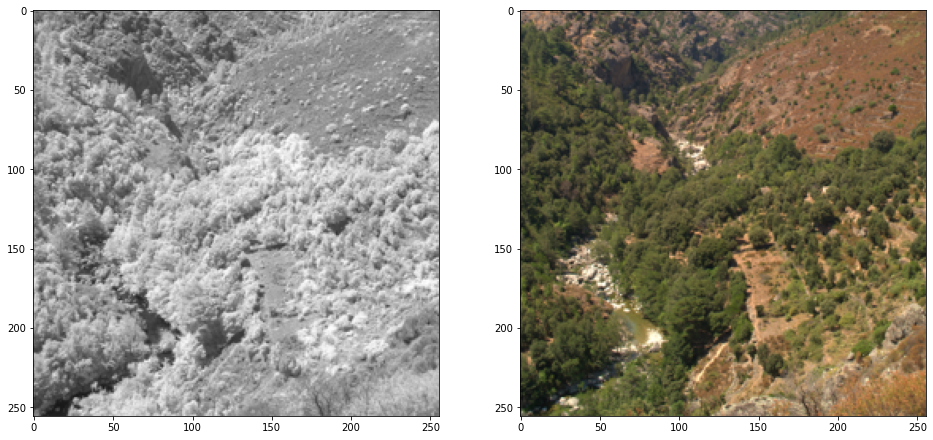

In [6]:
train_nir, train_rgb, val = load_dataset(isNIR=True)

imgInput, output = load_nir_img(os.listdir(train_nir)[0], train_nir, padding=True)

print(imgInput.shape)
print(output.shape)

# imgInput = np.squeeze(imgInput)
fig, (ax1,ax2) = plt.subplots(1, 2)
fig.set_size_inches(16, 16)
ax1.imshow(imgInput)
plt.imshow(output)
plt.show()

In [7]:
def load_gray_img(filename, path, lab=False, gray=False, padding=False):
  label = tf.io.read_file(path+"/"+filename)

  label = tf.image.decode_jpeg(label, channels=3)
  label = tf.image.convert_image_dtype(label, tf.float32) 
  label = tf.image.resize(label, [256, 256])
  input = tf.identity(label)

  if lab and gray:
    raise Exception("lab and gray can't be setted true at the same time")
  if not (lab or gray):
    raise Exception("lab and gray can't be setted false at the same time")

  if lab:
    tmp   = tf.numpy_function(cv2.cvtColor,[label, cv2.COLOR_RGB2Lab], tf.float32) #(x,y,3) 3=>lab
    tmp   = tmp/255.
    input = tmp[:,:,0]
    input = tf.expand_dims(input, -1)
    label = tmp[:,:,1:]
    if padding:
      padding = tf.zeros((256,256,1))
      input   = tf.concat([input,input,input], axis= -1)

  if gray:
    input = tf.image.rgb_to_grayscale(label)
    if padding:
      padding = tf.zeros((256,256,2))
      input   = tf.concat([input,input,input], axis= -1)
  
  return input, label

def gray_data_pipline(TRAINING, TESTING, batch_size=32, buffer_size=1000,
                      shuffel=False, lab=False, gray=False,
                      padding=False, augmant_list=None):

  train   = tf.data.Dataset.from_tensor_slices(os.listdir(TRAINING))
  test = tf.data.Dataset.from_tensor_slices(os.listdir(TESTING))

  if shuffel:
      train   = train.shuffle(buffer_size)
      test = test.shuffle(buffer_size)

  train = train.map(lambda filename: load_gray_img(filename, path=TRAINING, lab=lab,
                                               gray=gray, padding=padding),
                num_parallel_calls=tf.data.experimental.AUTOTUNE)
  
  test  = test.map(lambda filename:load_gray_img(filename, path=TESTING, lab=lab,
                                                gray=gray, padding=padding),
                  num_parallel_calls=tf.data.experimental.AUTOTUNE)
  
  if augmant_list:
    train   = train.map(lambda input,label: augmant(input,label, augmant_list),
                num_parallel_calls=tf.data.experimental.AUTOTUNE)

  train = train.batch(batch_size)
  test  = test.batch(1)
  
  train = train.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  test  = test.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

  return train, test

In [8]:
def data_pipline(TRAINING, TESTING, isNIR=False, batch_size=32,
                 buffer_size=1000, shuffel=False, lab=False,
                 gray=False, padding=False, augmant_list=None):
  if isNIR:
    return nir_data_pipline(TRAINING, TESTING, batch_size=batch_size,
                 buffer_size=buffer_size, shuffel=shuffel, lab=lab,
                 gray=gray, padding=padding, augmant_list=augmant_list)
    
  return gray_data_pipline(TRAINING, TESTING, batch_size=32,
                 buffer_size=buffer_size, shuffel=shuffel, lab=lab,
                 gray=gray, padding=padding, augmant_list=augmant_list)
  
  

--2020-08-30 01:39:36--  https://www.kaggle.com/arnaud58/landscape-pictures/download
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1599010777&Signature=SbSDlfXWPHMHYYrYS%2Fl7%2Btlv61agl76CW5gfEuZn8GoiihnDjt1H8zXp9a8yC86ZeBf6NPMqBkIYHiMsJJVfR46mXOtaCsXufJfGdXj4j9l60XzfHWc2Yd9y2dRdWfsPiZxUOpMqCKTgSPpXf9MSN10sI%2BX%2FyvNmwjwWAklnrbDT1nqkPIMrKk4TJvobSaA4kh8TxAmLfHiXRMKLUjLd8IoXijHc3Az1d4H9%2F1VPBO5jr4twmckJQcT1LZa1Smm79ZIs7%2FOn3js0rs4g%2BevopFoILX%2Bf0vqMfjEOCD4pEgnrEk%2BJIa2ly4JPabvUUbH2RDx3UYfcjnWORrTbZ%2BU7eA%3D%3D [following]
--2020-08-30 01:39:37--  https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-1

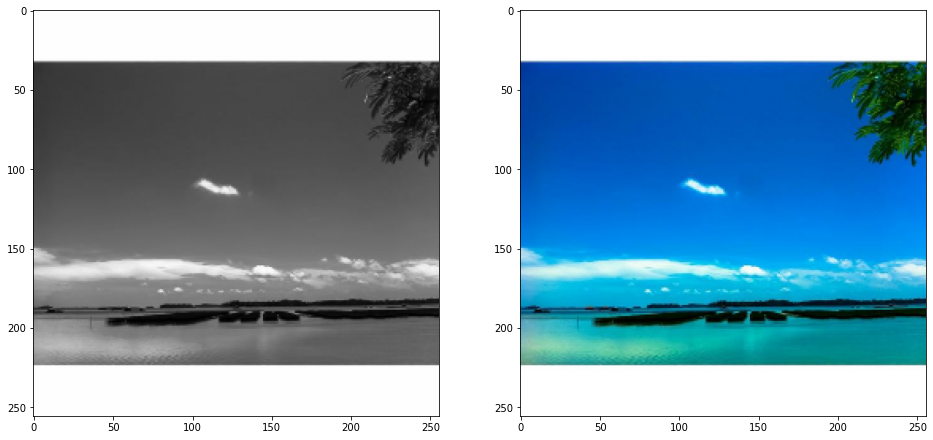

In [9]:
src = load_dataset()
TRAINING, TESTING = split_data(SOURCE=src)

imgInput, output = load_gray_img(os.listdir(TRAINING)[0], TRAINING, gray=True, padding=True)

print(imgInput.shape)
print(output.shape)
# imgInput = np.squeeze(imgInput)
fig, (ax1,ax2) = plt.subplots(1, 2)
fig.set_size_inches(16, 16)
ax1.imshow(imgInput)
plt.imshow(output)
plt.show()

(256, 256, 3)
(256, 256, 3)


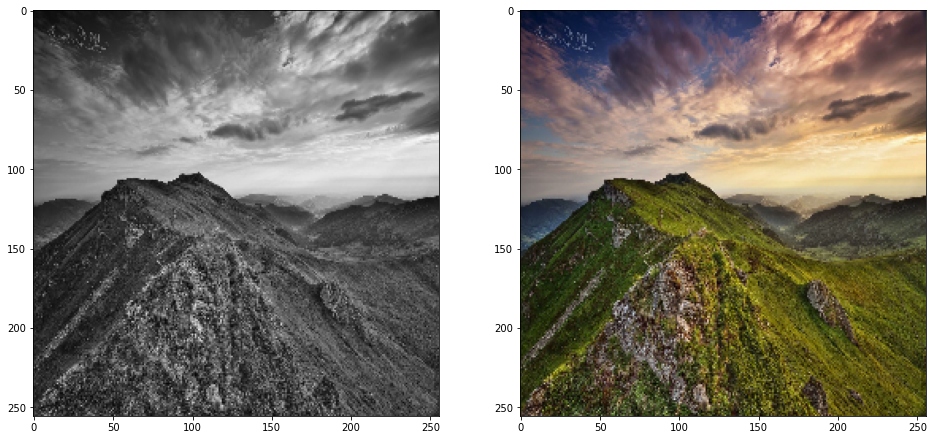

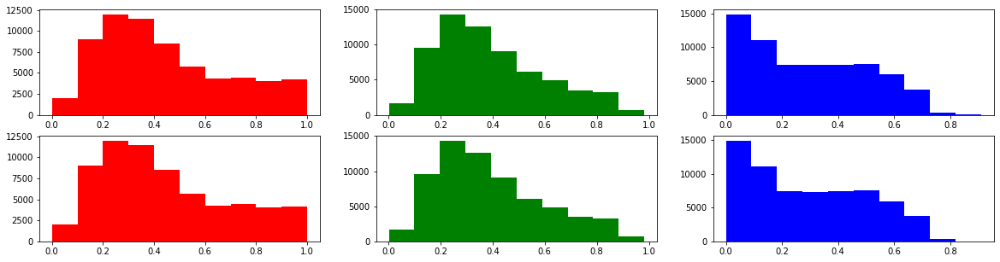

In [10]:
imgInput, output = load_gray_img(os.listdir(TRAINING)[4], TRAINING, gray=True, padding=True)

print(imgInput.shape)
print(output.shape)
# imgInput = np.squeeze(imgInput)
fig, (ax1,ax2) = plt.subplots(1, 2)
fig.set_size_inches(16, 16)
ax1.imshow(imgInput)
plt.imshow(output)
plt.show()
output = output.numpy()
red, green, blue = output[:,:,0], output[:,:,1], output[:,:,2]
red   = red.reshape((256*256))
green = green.reshape((256*256))
blue  = blue.reshape((256*256))

# print(red_histogram[0])
fig, ax = plt.subplots(2, 3)
fig.set_size_inches(20, 5)
ax[0][0].hist(red, color="red")
ax[0][1].hist(green, color="green")
ax[0][2].hist(blue, color="blue")

ax[1][0].hist(red, color="red")
ax[1][1].hist(green, color="green")
ax[1][2].hist(blue, color="blue")

plt.show()

(256, 256, 1)
(256, 256, 2)
(256, 256, 3)


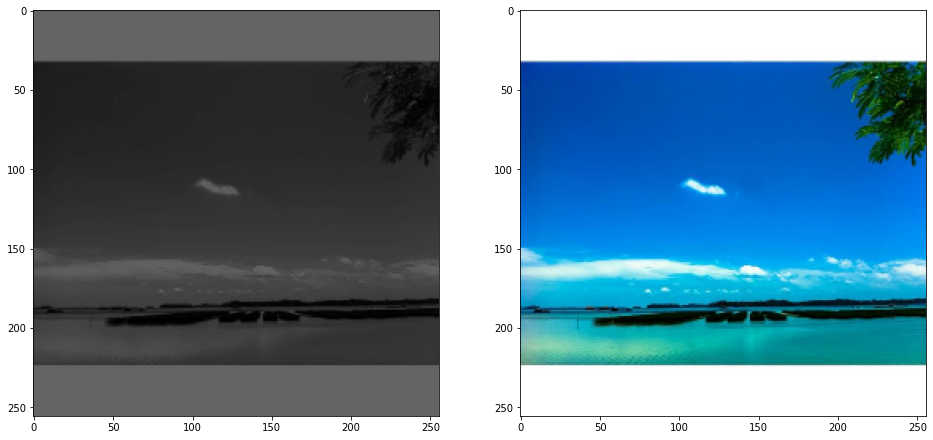

In [11]:
# train, test = data_pipline(TRAINING, TESTING, isNIR=False, gray=True)
imgInput, output = load_gray_img(os.listdir(TRAINING)[0], TRAINING, lab=True)

print(imgInput.shape)
print(output.shape)
img = np.concatenate((imgInput, output),axis=2)
print(img.shape)

colored_img = cv2.cvtColor(img*255, cv2.COLOR_LAB2RGB)

imgInput = np.squeeze(imgInput)
fig, (ax1,ax2) = plt.subplots(1, 2)
fig.set_size_inches(16, 16)
ax1.imshow(imgInput, cmap='gray', vmin=0, vmax=1)
ax2.imshow(colored_img)
plt.show()


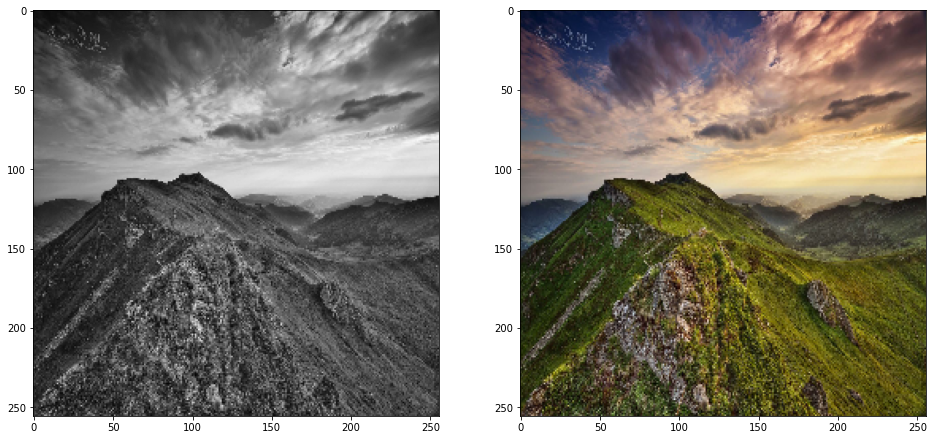

In [33]:
imgInput, output = load_gray_img(os.listdir(TRAINING)[3], TRAINING, gray=True)

augmant_map = [
               {
                 "name"  :"random_flip_left_right",
                 "values":{
                     "seed":None
                 } 
               }
              ]

imgInput, output = augmant(imgInput, output, augmant_map)

imgInput = np.squeeze(imgInput)
fig, (ax1,ax2) = plt.subplots(1, 2)
fig.set_size_inches(16, 16)
ax1.imshow(imgInput, cmap='gray', vmin=0, vmax=1)
ax2.imshow(output)
plt.show()

In [13]:
#build

def psnr(y_true, y_pred, max_val=1):
  psnr = tf.reduce_mean(tf.image.psnr(y_true, y_pred, max_val= max_val))
  return psnr

def ssim(y_true, y_pred, max_val=1):
  ssim = tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val= max_val))
  return ssim

def cosine_loss(y_true, y_pred):
  cosine_loss = tf.keras.losses.CosineSimilarity(axis=1)
  theta = tf.math.acos(cosine_loss(y_true, y_pred))
  return theta 

def hist(img):
  if len(img.shape)==3:
    img = tf.expand_dims(img, axis=0)
  
  red, green, blue = img[:,:,:,0], img[:,:,:,1], img[:,:,:,2]
  
  shape = tf.shape(red)
  
  red   = tf.reshape(red, [shape[0], shape[1]*shape[2]])
  # print(np.sum(red))
  green = tf.reshape(green, [shape[0], shape[1]*shape[2]])
  blue  = tf.reshape(blue, [shape[0], shape[1]*shape[2]])
  
  value_range = [0, 1]

  red_hist   = tf.histogram_fixed_width(red, value_range=value_range, nbins=10)
  # print(red_hist)
  green_hist = tf.histogram_fixed_width(green, value_range=value_range, nbins=10)
  blue_hist  = tf.histogram_fixed_width(blue, value_range=value_range, nbins=10)
  return red_hist[0], green_hist[0], blue_hist[0]

def histogram_loss(y_true, y_pred):
  true_red_hist, true_green_hist, true_blue_hist = hist(y_true)
  pred_red_hist, pred_green_hist, pred_blue_hist = hist(y_pred)

  # print("true_red_hist: ",true_red_hist)
  # print("sum: ", np.sum(true_red_hist)-(256*256))
  # print("pred_red_hist: ",pred_red_hist)
  # print("mse: ", np.mean((true_red_hist - pred_red_hist)**2))

  # x = 256*256
  x = tf.constant(42949672)

  red_mse   = tf.reduce_mean(tf.math.pow((true_red_hist - pred_red_hist), 2))
  green_mse = tf.reduce_mean(tf.math.pow((true_green_hist - pred_green_hist), 2))
  blue_mse  = tf.reduce_mean(tf.math.pow((true_blue_hist  - pred_blue_hist), 2))

  red_mse_cliped = tf.clip_by_value(red_mse, clip_value_min=0, clip_value_max=x)/x
  green_mse_cliped = tf.clip_by_value(green_mse, clip_value_min=0, clip_value_max=x)/x
  blue_mse_cliped = tf.clip_by_value(blue_mse, clip_value_min=0, clip_value_max=x)/x

  total_mse = tf.math.scalar_mul(0.6, tf.cast(red_mse_cliped, dtype=tf.float32)) +\
               tf.math.scalar_mul(0.2, tf.cast(green_mse_cliped, dtype=tf.float32)) +\
                tf.math.scalar_mul(0.2, tf.cast(blue_mse_cliped, dtype=tf.float32))

  return total_mse

def loss_function(y_true, y_pred):
  loss = 1*psnr(y_true, y_pred, max_val=1)+56*ssim(y_true, y_pred, max_val=1)+17.8*cosine_loss(y_true, y_pred)-56*histogram_loss(y_true, y_pred)
  return -loss

def def_model():
  model = tf.keras.models.Sequential([
                                    layers.Input(shape=(256,256,3)),
                                    layers.Conv2D(256, (3,3), activation= 'relu', padding= 'same'), 
                                    layers.BatchNormalization(),
                                    layers.Conv2D(128, (3,3), activation= 'relu', padding= 'same'), 
                                    layers.BatchNormalization(),
                                    layers.Conv2D(128, (3,3), activation= 'relu', padding= 'same'),
                                    layers.BatchNormalization(),
                                    layers.Conv2D(64, (3,3), activation= 'relu', padding= 'same'),
                                    layers.BatchNormalization(),
                                    layers.Conv2D(32, (3,3), activation= 'relu', padding= 'same'),
                                    layers.BatchNormalization(),
                                    layers.Conv2D(3, (3,3), activation= 'sigmoid', padding= 'same')
    ])
  return model

def build(model, optimizer, loss, metrics=None):

  if metrics:
    model.compile(optimizer=optimizer, loss=loss, metrics=metrics)
  else:
    model.compile(optimizer=optimizer, loss=loss)
    
  return model

In [14]:
#one step
def one_step(train, val, epoch):
  pass

In [15]:
#ALL steps
def all_steps(model, train, val, epochs, one_step=None, callbacks=None):
  if one_step:
    train = iter(train)
    val = iter(val)
    history = h
    for epoch in range(epochs):
      current_train = next(train)
      current_val = next(val)
      h = one_step(current_train, current_val, epoch)
      history.append[h]
  else:
    history = model.fit(train,
                epochs=epochs,
                validation_data=val,
                verbose=1,
                callbacks=callbacks
                )
  return history


In [16]:
#Eval
def evaluate(model, val):
  eval = model.evaluate(val)
  return eval

In [17]:
# Plotter
def plotter(model, st, idx, lab=False):

  instance = next(iter(st.take(1)))
  input = instance[0][idx]
  label = instance[1][idx]
  input_batch = np.expand_dims(input, axis = 0)
  y_hat = model.predict(input_batch)[0]
  input = input[:,:,0] #[hight, width, color]    


  if lab:
    input = np.expand_dims(input, axis = -1)
    img = np.concatenate((input, y_hat),axis=2)
    y_hat = cv2.cvtColor(img*255, cv2.COLOR_LAB2RGB)

    img = np.concatenate((input, label),axis=2)
    label = cv2.cvtColor(img*255, cv2.COLOR_LAB2RGB)

  print("Mono shape:          ", input.shape)
  print("Colored ground truth shape: ", label.shape)
  print("Prediction shape:    ", y_hat.shape)
  print("")
  print("pnsr: ", psnr(label, y_hat))
  print("ssim: ", ssim(label, y_hat))
  print("theta: ", cosine_loss(label, y_hat))
  print("histogram_loss: ", histogram_loss(label, y_hat))
  print("loss: ", loss_function(label, y_hat))
  print("")

  input = np.squeeze(input)

  plt.figure()
  f, axarr = plt.subplots(1,3) 
  axarr[0].imshow(input, cmap='gray', vmin=0, vmax=1)
  axarr[1].imshow(label)
  axarr[2].imshow(y_hat)

  axarr[0].axis('off')
  axarr[1].axis('off')
  axarr[2].axis('off')

  axarr[0].set_title('Input')
  axarr[1].set_title('Ground truth')
  axarr[2].set_title('Prediction')

  #axarr[2].imshow(input)


  fig, (ax1,ax2) = plt.subplots(1, 2)
  # fig.suptitle("Ground truth VS Prediction")
  fig.set_size_inches(16, 16)
  ax1.imshow(label)
  ax1.set_title("Ground truth")
  ax1.axis('off')

  ax2.imshow(y_hat)
  ax2.set_title("Prediction")
  ax2.axis('off')
  plt.show()

In [18]:
def ex_plotter(st, idx, lab=False):

  instance = next(iter(st.take(1)))
  input = instance[0][idx]
  label = instance[1][idx]
  input = input[:,:,0] #[hight, width, color]    


  if lab:
    input = np.expand_dims(input, axis = -1)

    img = np.concatenate((input, label),axis=2)
    label = cv2.cvtColor(img*255, cv2.COLOR_LAB2RGB)

  print("Mono shape:          ", input.shape)
  print("Colored ground truth shape: ", label.shape)
  print("")

  input = np.squeeze(input)

  plt.figure()
  f, axarr = plt.subplots(1,2) 
  axarr[0].imshow(input, cmap='gray', vmin=0, vmax=1)
  axarr[1].imshow(label)

  axarr[0].axis('off')
  axarr[1].axis('off')

  axarr[0].set_title('Input')
  axarr[1].set_title('Ground truth')

  #axarr[2].imshow(input)


  fig, (ax1,ax2) = plt.subplots(1, 2)
  # fig.suptitle("Ground truth VS Prediction")
  fig.set_size_inches(16, 16)

  ax1.imshow(input, cmap='gray', vmin=0, vmax=1)
  ax1.set_title("Input")
  ax1.axis('off')

  ax2.imshow(label)
  ax2.set_title("Ground truth")
  ax2.axis('off')
  plt.show()

In [22]:
def train_wokflow(load_split=False, isNIR=False, lab=False, gray= False, padding=True,
                  loss = loss_function, model=None, metrics=None, batch_size = 32, isbuild=True):
  if load_split and not isNIR:
    src = load_dataset()
    TRAINING, TESTING = split_data(SOURCE=src)
  
  if isNIR:
    TRAINING, train_rgb, TESTING = load_dataset(isNIR=True)


  train, val = data_pipline(TRAINING, TESTING, isNIR=isNIR, lab=lab, gray=gray, padding=padding, batch_size=batch_size)

  if not model:
    model = def_model()
  if isbuild:
    model = build(model, "adam", loss, metrics)  
  
  print("Input shape: ", next(iter(train))[0].shape)
  print("Label shape: ", next(iter(train))[1].shape)

  evaluate_score = evaluate(model, val)
  print("evaluation before train: ", evaluate_score)

  print("-------start train--------")
  history = all_steps(model, train, val, 9)
  print("-------end train--------")
  
  evaluate_score = evaluate(model, val)
  print("evaluation after train: ", evaluate_score)
  plotter(model=model, st=train, idx=1, lab=lab)

  return model

In [23]:
def eval_loss(idx, st, r, g, b, flip_left_right, contrast, brightness, saturation):
  instance = next(iter(st.take(1)))
  label = instance[1][idx]
  y_hat = label
  y_hat = y_hat.numpy()
  y_hat[:,:,0]=y_hat[:,:,0]+(r/255.)
  y_hat[:,:,1]=y_hat[:,:,1]+(g/255.)
  y_hat[:,:,2]=y_hat[:,:,2]+(b/255.)

  if flip_left_right:
    y_hat = tf.image.flip_left_right(y_hat)
    label = tf.image.flip_left_right(label)

  y_hat = tf.image.adjust_contrast(y_hat, contrast)
  y_hat = tf.image.adjust_brightness(y_hat, brightness)
  y_hat = tf.image.adjust_saturation(y_hat, saturation)

  print("pnsr: ", psnr(label, y_hat).numpy())
  print("ssim: ", ssim(label, y_hat).numpy())
  print("theta: ", cosine_loss(label, y_hat).numpy())
  print("histogram_loss: ", histogram_loss(label, y_hat).numpy())
  print("loss: ", loss_function(label, y_hat).numpy())
  print("")

  fig, (ax1,ax2) = plt.subplots(1, 2)
  # fig.suptitle("Ground truth VS Prediction")
  fig.set_size_inches(16, 16)
  ax1.imshow(label)
  ax1.set_title("Ground truth")
  ax1.axis('off')

  ax2.imshow(y_hat)
  ax2.set_title("Prediction")
  ax2.axis('off')
  plt.show()
  

In [24]:
# incase you need it
src = load_dataset()
TRAINING, TESTING = split_data(SOURCE=src)
train, test = data_pipline(TRAINING, TESTING, isNIR=False,gray=True, padding=True, lab=False, shuffel= True)

--2020-08-30 01:42:27--  https://www.kaggle.com/arnaud58/landscape-pictures/download
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1599010948&Signature=GuK4u7YqAPsl55eSwKIpDZIq7b2%2F1mwYlkVZJywwBhhGl1i9mhZpZEnL%2BILiJwrxeD4%2FljGfQ%2FAwr%2FxgfSdAvPl8f%2FDWhDcWYnYEqjzkgk52DTJ5wCa5KkxRhP6yYsXsuSA1GHhpUD1i0PIFmOe9Bs86j9vZpQGgjzBIPRoSHk7o4ebEyK9n5Pc7CKqeXOGv%2BOe4D9HUnAsvXbp8UXT6zhlPTBsQIKC%2FvGYWW7GwKFboShkpcVOBJPfQ82Gho702lxYqV3DNCAfMJpGJWezfpGLWL96KKYDumzquS5muRcFS1JDVk3UKbnZhhsx%2F8UFoLmh%2B%2F9pm%2FwtnxS4a88koaA%3D%3D [following]
--2020-08-30 01:42:28--  https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kagg

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


pnsr:  20.0
ssim:  0.9518797
theta:  3.022442
histogram_loss:  0.60053205
loss:  -93.474945



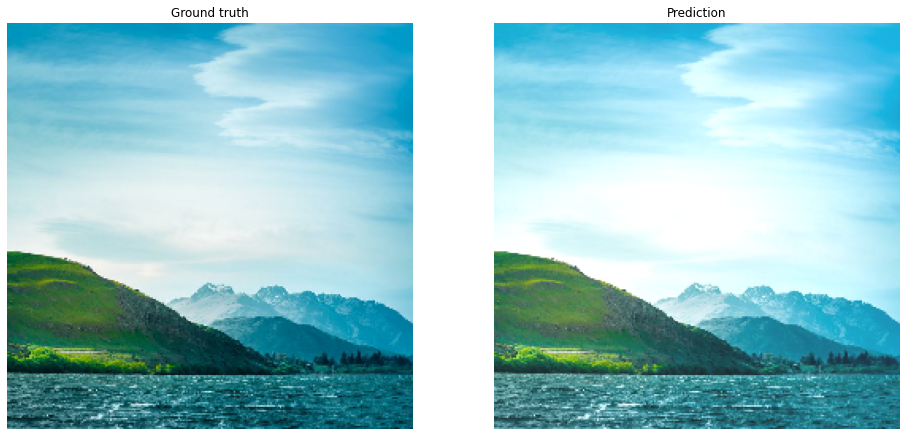

In [31]:
eval_loss(idx=5, st=train, r=0, g=00, b=00, flip_left_right=True, contrast=1, brightness=0.1, saturation=1)

In [ ]:
#tensor board
%load_ext tensorboard


### Testing CIE-LAB 

--2020-07-26 19:41:29--  https://www.kaggle.com/arnaud58/landscape-pictures/download
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1596051689&Signature=bBi%2BfpCll%2BblW7QzVFIXlWl9CwH%2Filz63ZquFRsKv5uhNNjVNQlnvF%2BSgoaXJxLF%2BuZxRnDXRv0Tw4zCdHFeIEpmYmLauwvbGpgHlqw2vd7eN%2B6t6Oy0fDPbxhi3u%2F%2BOyXao7GnT8HHs9dFFVaUo%2F0DGMLF0jvygbQQQcDrX2R7LxX7SKHtH4UqwMtfLuOm%2BlSnBGlzj9S6sOmibgTrMnyrhZ2xftrUxdzzFs6bsMhetWR2stwiRBHOu897TYq9F8hzSBNNei17p37DpNM4t83ZnE%2BqQAJ0Q5lNOvSbZPKu%2FHlfRz0wYAyCmSr8A4%2B1Uy9b8vgiP%2BqaTVPT8nqzdWQ%3D%3D [following]
--2020-07-26 19:41:29--  https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@

<Figure size 432x288 with 0 Axes>

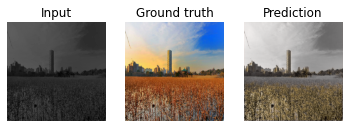

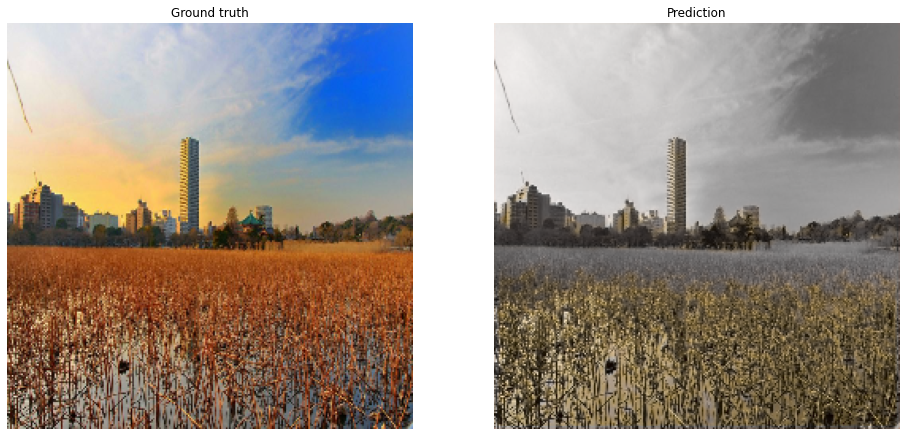

In [ ]:
model1 = train_wokflow(load_split=True, isNIR=False, lab=True, padding=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mono shape:           (256, 256, 1)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

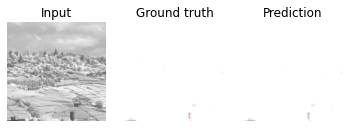

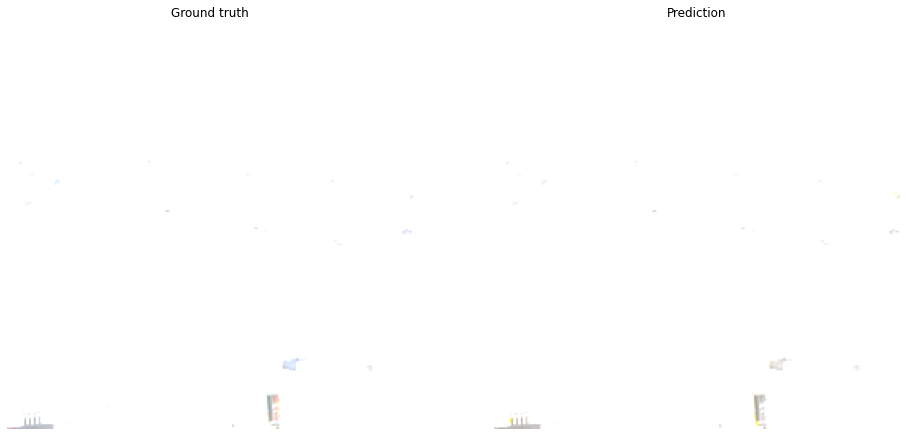

In [ ]:
train_nir, train_rgb, val = load_dataset(isNIR=True)
train_nir, test_nir = data_pipline(train_nir, val, isNIR=True, padding=True, lab=True)
plotter(model1, train_nir, 1, lab=True)

### Testing Gray Scale Images 

--2020-07-27 12:58:30--  https://www.kaggle.com/arnaud58/landscape-pictures/download
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1596113910&Signature=T%2Bur2L3P%2FP%2BkCKYKeZ7DU9WVZIf2KWryRsSBxDVOWL1XRzvA0VyFMNjPoEf0BGEov2tgKtDcLXNkFakS2u4D5oZRv7gXG7leJoRL8BHg7YXsV9eSyiaa2NkctcrZ6j3b9EEa%2Fj%2Fgz8KEroZA%2FgU9Ot50ePli1Z7iu9Xsdyx42IeixPJoLq6ltJo2lnBfkeDKUBsyQ%2F5ub3mxUvU5nu2q%2BymJpYgZaeDL6cPmT6x6Cf5deygRzOb%2FNz3%2FvlYKqNtgQL8ltNi551bXeKaI8IUgYvggR2hfnpCy2jKwCUy1Xv1IIXnXH%2FNBDIzhD8HsXyNiWXWkeGwvwRYqUEEXk%2BgjWA%3D%3D [following]
--2020-07-27 12:58:30--  https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kagg

<Figure size 432x288 with 0 Axes>

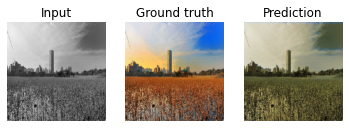

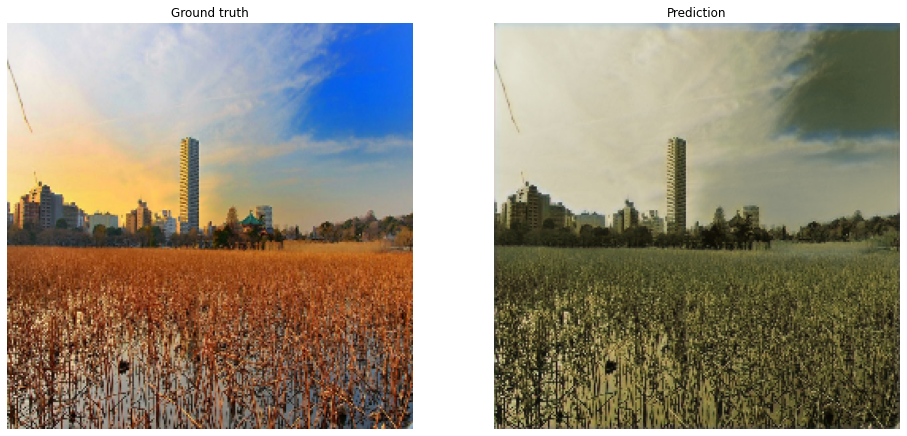

In [ ]:
model2 = train_wokflow(load_split=True, isNIR=False, lab=False, gray = True, padding=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mono shape:           (256, 256)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

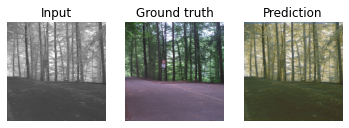

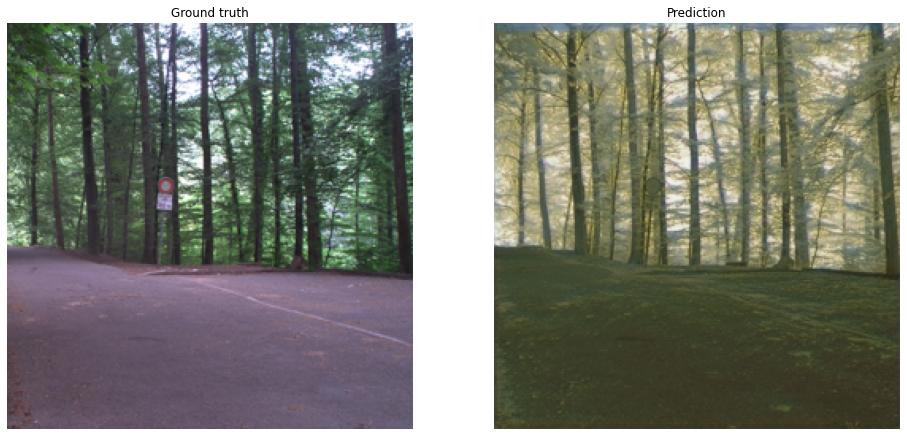

In [ ]:
train_nir, train_rgb, val = load_dataset(isNIR=True)
train_nir, test_nir = data_pipline(train_nir, val, isNIR=True,gray=False, padding=True, lab=False, shuffel= True)
plotter(model2, train_nir, 30, lab=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Input shape:  (32, 256, 256, 3)
Label shape:  (32, 256, 256, 3)
18/18 [==============================] - 3s 191ms/step - loss: 0.0639
evaluation before train:  0.06391812115907669
-------start train--------
Epoch 1/9
12/12 [==============================] - 60s 5s/step - loss: 0.0769 - val_loss: 0.0918
Epoch 2/9
12/12 [==============================] - 46s 4s/step - loss: 0.0677 - val_loss: 0.0579
Epoch 3/9
12/12 [==============================] - 46s 4s/step - loss: 0.0541 - val_loss: 0.0575
Epoch 4/9
12/12 [==============================] - 46s 4s/step - loss: 0.0532 - val_loss: 0.0593
Epoch 5/9
12/12 [==============================] - 46s 4s/step - loss: 0.0506 - val_loss: 0.0585
Epoch 6/9
12/12 [==============================] - 46s 4s/step - loss: 0.0500 - val_loss: 0.0587
Epoch 7/9
12/12 [==============================] - 46s 4s/step - loss: 0.0486 - va

<Figure size 432x288 with 0 Axes>

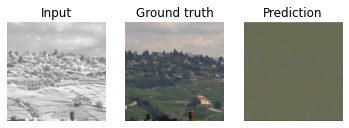

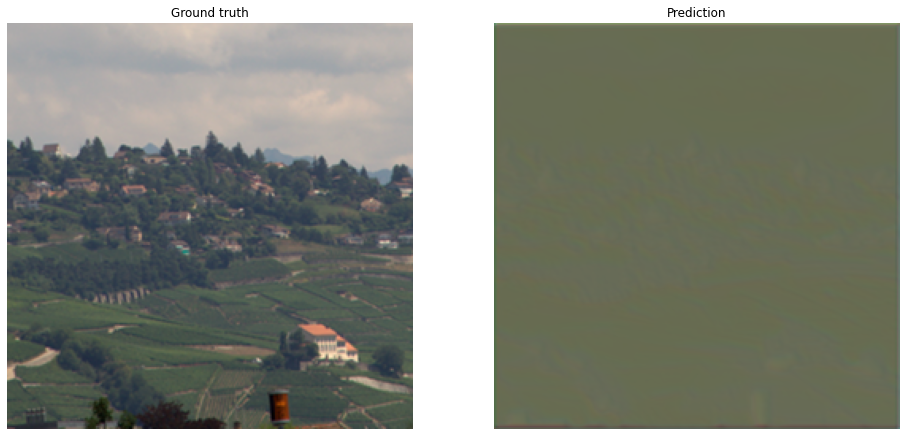

In [ ]:
model3 = train_wokflow(load_split=False, isNIR=True, lab=False, gray = False, padding=True)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mono shape:           (256, 256)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

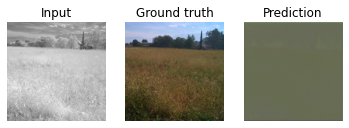

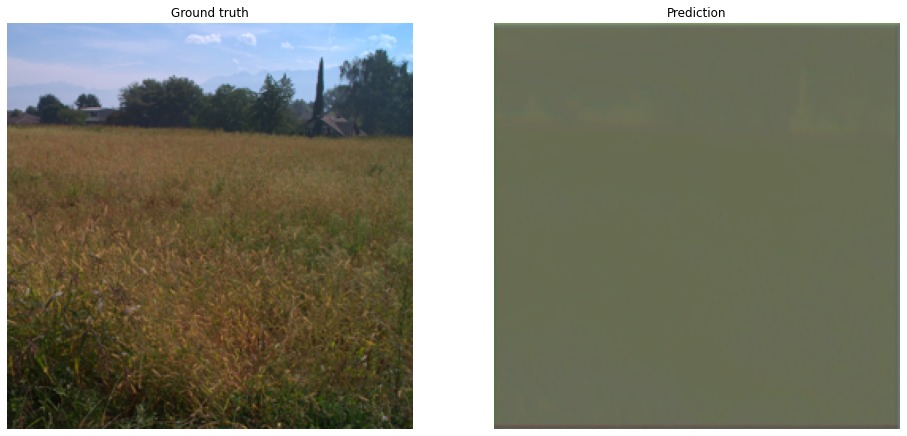

In [ ]:
train_nir, train_rgb, val = load_dataset(isNIR=True)
train_nir, test_nir = data_pipline(train_nir, val, isNIR=True,gray=False, padding=True, lab=False, shuffel= True)
plotter(model3, train_nir, 15, lab=False)

## training the model on gray scale using custom loss function

--2020-08-05 21:33:42--  https://www.kaggle.com/arnaud58/landscape-pictures/download
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1596922422&Signature=NhOBBGCG%2Bi1T9HZWG6QKsrjR%2BYF7VdImYzNQ9Nt6oHtd9jW6oNKxDjFv22iKD%2BrkZlvim5omrFEugfiFujsH%2BfDQtVhmNUTNhHuaF8xBVlCFql5BqxAodNh%2FDcWktIW5UINUOQVXBoBS4NQPhPmoZPm3z%2FI6oJpyPgx4DQKA1A1vV%2FTF4im1r9xS1xeLe1x1A%2F1ZKuzDsve7NVkr4oDTnn02p9%2BKVQF7MnMlLYLrzWEy%2FkOgIBUaJoZm2MkgPHL6ibrN3erBEfFLKuExuQ2%2FKn95FGjgbZ5EScUfltFuxIKktLIJ0GdTfkdrN%2BZdJXT44masuZYXB9mBe29x89P1pw%3D%3D [following]
--2020-08-05 21:33:42--  https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kagg

<Figure size 432x288 with 0 Axes>

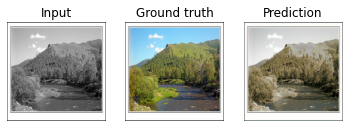

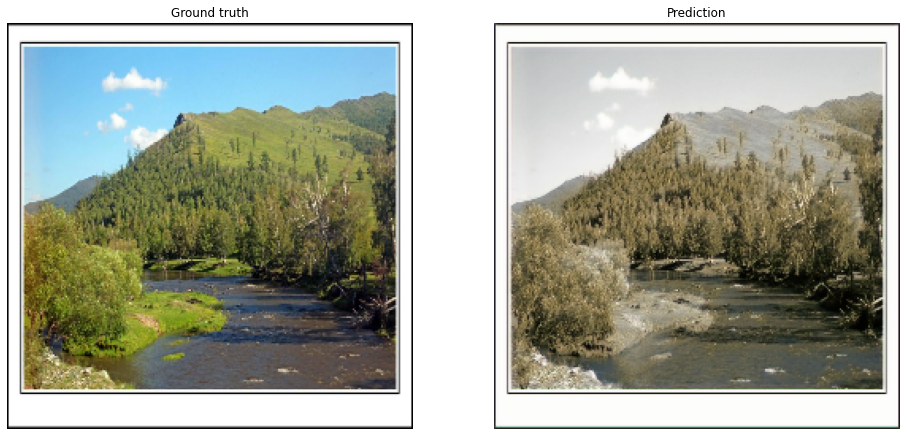

In [ ]:
model4 = train_wokflow(load_split=True, isNIR=False, lab=False, gray = True, padding=True)

--2020-08-05 22:06:00--  https://www.kaggle.com/arnaud58/landscape-pictures/download
Resolving www.kaggle.com (www.kaggle.com)... 35.244.233.98
Connecting to www.kaggle.com (www.kaggle.com)|35.244.233.98|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.iam.gserviceaccount.com&Expires=1596924360&Signature=OVXDg9FKPtPs1X7UZ3sb5XElu5itww30%2FjTPKWnafv7yu%2BOuHeJoJVGoJJ5REx3fXFiKgjcQo2yE%2FbH4Vsq0lXqU37GKuw1GTNI0TrX2yhufPCgqcJclm4n0%2BhBCGxz2WSCbuhLCkloPgTgPrIzGXpyXgUv122rVWoep5TwWtnmMw3%2FitoFVGQ0Zie0bR8zeS7auDHUP5hXisLf8l2vX1gEdgZG%2BLTI9jWrbT75vPE8XStFOgAlNWkicKxm%2F2VAIZdxQm37V2r0clsaYROsxHWLAKg1M0WPG7UtqlwUwQY6PZ8YLW7KruNGChQcI4iAPFyuo7mjpTJyhb2LoPwlq5g%3D%3D [following]
--2020-08-05 22:06:00--  https://storage.googleapis.com/kaggle-data-sets/298806%2F1217826%2Fbundle%2Farchive.zip?GoogleAccessId=gcp-kaggle-com@kaggle-161607.

<Figure size 432x288 with 0 Axes>

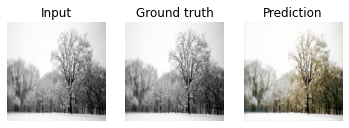

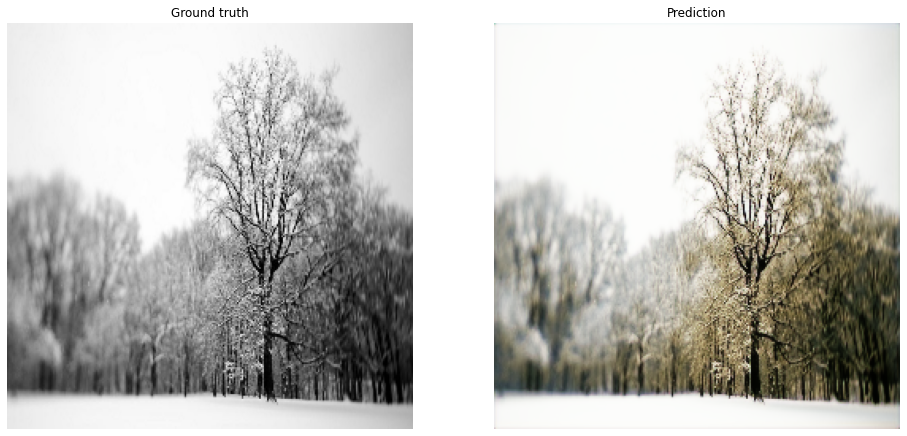

In [ ]:
src = load_dataset()
TRAINING, TESTING = split_data(SOURCE=src)
train, test = data_pipline(TRAINING, TESTING, isNIR=False,gray=True, padding=True, lab=False, shuffel= True)
plotter(model4, train, 20, lab=False)

Mono shape:           (256, 256)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

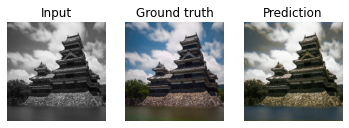

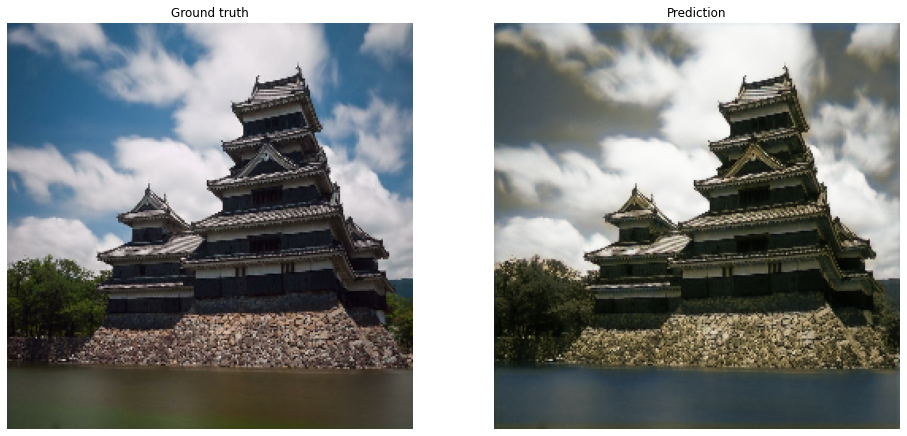

In [ ]:
plotter(model4, train, 20, lab=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mono shape:           (256, 256)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

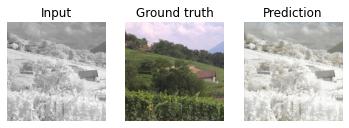

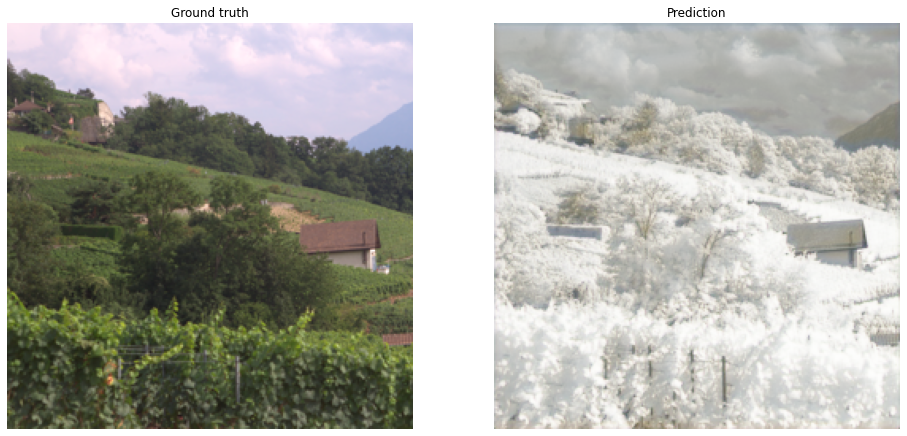

In [ ]:
train_nir, train_rgb, val = load_dataset(isNIR=True)
train_nir, test_nir = data_pipline(train_nir, val, isNIR=True,gray=False, padding=True, lab=False, shuffel= True)
plotter(model4, train_nir, 30, lab=False)

Mono shape:           (256, 256)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

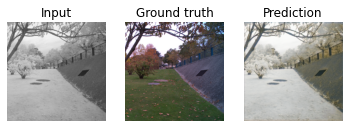

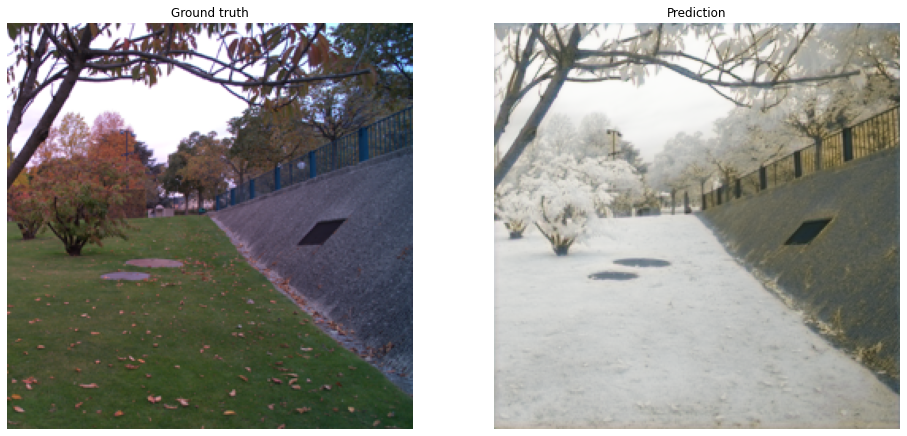

In [ ]:
plotter(model4, train_nir, 15, lab=False)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Input shape:  (32, 256, 256, 3)
Label shape:  (32, 256, 256, 3)
18/18 [==============================] - 5s 292ms/step - loss: -7.3410
evaluation before train:  -7.34096622467041
-------start train--------
Epoch 1/9
12/12 [==============================] - 113s 9s/step - loss: -9.2032 - val_loss: -7.5795
Epoch 2/9
12/12 [==============================] - 21s 2s/step - loss: -9.5934 - val_loss: -7.3385
Epoch 3/9
12/12 [==============================] - 20s 2s/step - loss: -9.6292 - val_loss: -8.3660
Epoch 4/9
12/12 [==============================] - 20s 2s/step - loss: -9.8085 - val_loss: -8.3975
Epoch 5/9
12/12 [==============================] - 20s 2s/step - loss: -9.8048 - val_loss: -7.8387
Epoch 6/9
12/12 [==============================] - 20s 2s/step - loss: -9.9314 - val_loss: -8.5047
Epoch 7/9
12/12 [==============================] - 20s 2s/step - loss:

<Figure size 432x288 with 0 Axes>

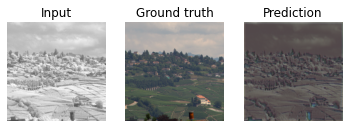

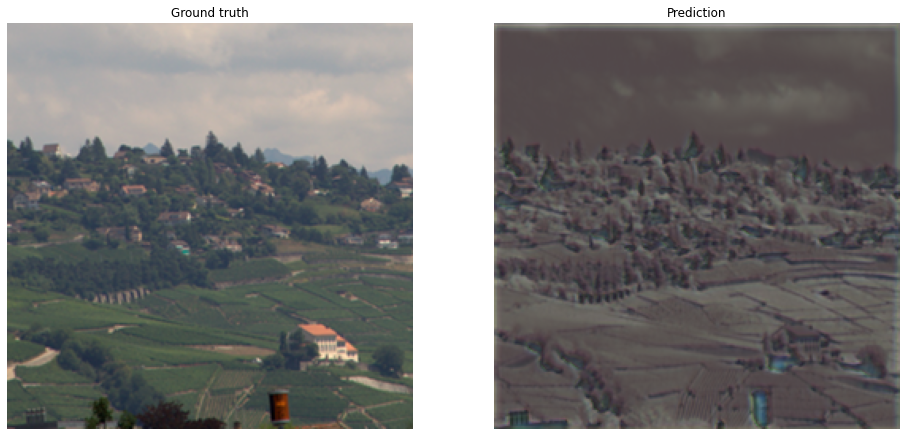

In [ ]:
model5 = train_wokflow(load_split=False, isNIR=True, lab=False, gray = False, padding=True, model=model4)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Mono shape:           (256, 256)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

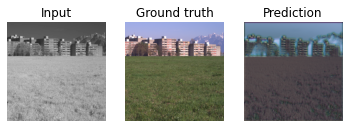

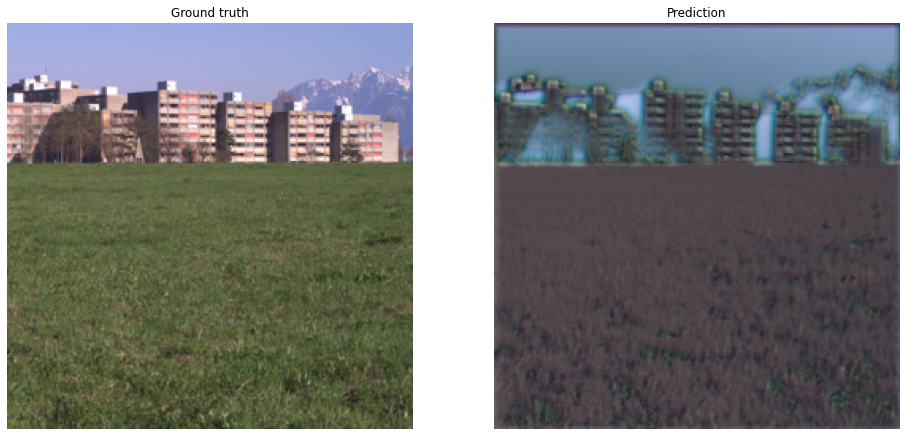

In [ ]:
train_nir, train_rgb, val = load_dataset(isNIR=True)
train_nir, test_nir = data_pipline(train_nir, val, isNIR=True,gray=False, padding=True, lab=False, shuffel= True)
plotter(model5, train_nir, 15, lab=False)

Mono shape:           (256, 256)
Colored ground truth shape:  (256, 256, 3)
Prediction shape:     (256, 256, 3)



<Figure size 432x288 with 0 Axes>

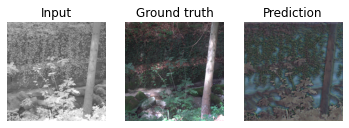

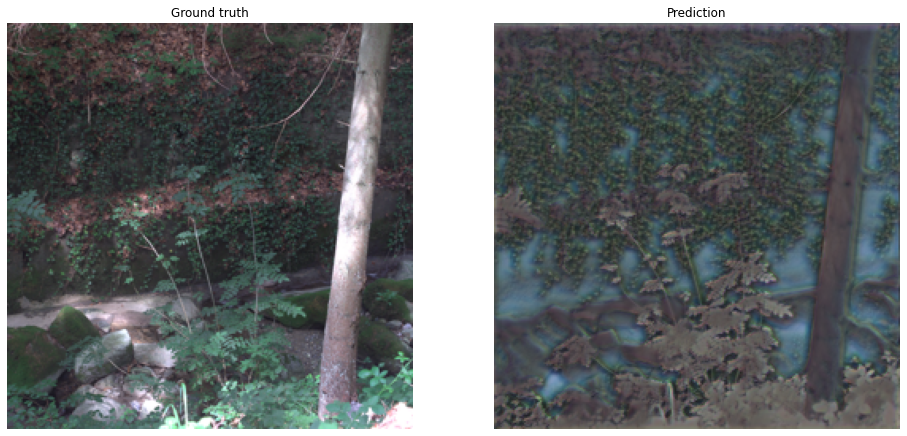

In [ ]:
plotter(model5, train_nir, 6, lab=False)